# Swisscom Challenge : Identifying similar zones

In this assignment we are going to be using the [Swisscom Heatmaps API](https://digital.swisscom.com/products/heatmaps/info) to identify similar zones based on density evolution though the day.

This API provides hourly density information based on SIM card data, for the whole swiss territory. The resolution of the data is a 100mx100m grid.

To access the API and the data you need to register. There is a free demo plan, that lets you access data from the 27th of January 2020. This day will be our main focus throughout this notebook.

## Preliminary steps

The access tokens for the API are stored in a `.env` file with the following keys :
- `CLIENT_ID` : is the client id from the Authorization portal
- `CLIENT_SECRET` : is the client secret for the API

Such tokens can be created by creating an application under the right subscription in the [Portal](https://digital.swisscom.com/my/subscriptions/). After approval (which usually takes less than an hour) you are good to go !

## Importing necessary modules

In [1]:
import os
import pandas as pd
import numpy as np
import importlib
import matplotlib.pyplot as plt

# custom modules
import osm_tiles
import heatmaps_api
import visualize

In [2]:
# defining constants for columns
TILES_KEY = 'tiles'
TILE_ID_KEY = 'tileId'
REQUEST_NBR = 'req_nbr'
SCORE_KEY = 'score'

In [3]:
importlib.reload(heatmaps_api)
# get an api handle from oauth using the CLIENT_ID and CLIENT_SECRETS defined in .env
api_handle = heatmaps_api.get_api_handle()
heatmaps_api.check_token_validity(api_handle)

Token expires on: 31 December 2021 at 09:14:42


When calling the `/grids/districts/{district_number}` api endpoint we get a list of objects:
- `tileId` : ID of the tile (integer)
- `ur` : upper right coordinates of the tile in WGS84
    - `x` : longitude (double)
    - `y` : latitude (double)
- `ll` : lower left coordinates of the tile in WGS84
    - `x` : longitude (double)
    - `y` : latitude (double)


In [4]:
def fetch_tile_ids_for_district(api_handle, district_nbr):
    """
    Given a district number, fetch the tile ids in that district

    :param api_handle: the oauth object to make requests
    :param district_nbr: the district number to query tiles for
    :return: Dataframe with tiles for the district
    """
    f_name_tile_coords = f'data/tiles_coords_{district_nbr}.pkl'
    # check if there already exists a cached version of the requested data
    if not os.path.exists(f_name_tile_coords):
        ol_tiles_response = heatmaps_api.get_tile_ids_from_district(api_handle, district_nbr)
        if ol_tiles_response.ok:
            ol_tiles_json = ol_tiles_response.json()
            df = pd.json_normalize(ol_tiles_json[TILES_KEY], sep='_')
            df.to_pickle(f_name_tile_coords)
        else:
            print(ol_tiles_response, ol_tiles_response['code'])
    else:
        print(f'Loading tile coords for district nbr {district_nbr} from cached file')
        df = pd.read_pickle(f_name_tile_coords)
    return df

In [5]:
def fetch_scores(api_handle, tile_coords_df, district_nbr, date_range):
    """
    Get the scores of all the tiles in :tile_coords_df: for a certain :date_range:

    :param api_handle: the oauth object to make requests
    :param tile_coords_df: a Dataframe with tile infos
    :param district_nbr: the district number to query scores for
    :param date_range: the time intervals for which to query the scores
    :return: Dataframe with scores for tiles that have at least 50% valid data,
    other tiles are dropped
    """
    file_name_scores = f'data/scores_clean_{district_nbr}.pkl'
    if not os.path.exists(file_name_scores):
        # map request numbers to tiles to not exceed MAX_NB_TILES_REQUEST
        request_df = tile_coords_df.copy()
        request_df[REQUEST_NBR] = request_df.index.map(lambda x: x//heatmaps_api.MAX_NB_TILES_REQUEST)

        results_hours = []
        for query_date in date_range:
            print(query_date)
            results = []
            for group, df_req in request_df.groupby(REQUEST_NBR):
                tile_ids_to_request = df_req.tileId.tolist()
                tiles_response = heatmaps_api.get_dwell_density(api_handle, query_date, tile_ids_to_request)
                json_response = tiles_response.json()
                if json_response.get(TILES_KEY):
                    results += json_response[TILES_KEY]
            df = pd.json_normalize(results).rename(columns={SCORE_KEY: query_date}).set_index(TILE_ID_KEY)
            results_hours.append(df)

        copied_coords_df = request_df.drop(columns=[REQUEST_NBR]).set_index(TILE_ID_KEY)
        score_df = copied_coords_df.join(results_hours)

        # droping NaN cells
        scores_clean = score_df.dropna(thresh=12).fillna(10)

        scores_clean.to_pickle(file_name_scores)
    else:
        print(f'Loading tile scores for district nbr {district_nbr} from cached file')
        scores_clean = pd.read_pickle(file_name_scores)
    return scores_clean

## Testing for the region of Lausanne

### Get the tileIds and their associated coordinates

In [6]:
# lausanne, west-lausanne,
district_nbrs = [2225, 2229]

tile_coords = []
for district_nbr in district_nbrs:
    tile_coords.append(fetch_tile_ids_for_district(api_handle, district_nbr=district_nbr))
tile_coords_df_all = pd.concat(tile_coords).drop_duplicates()
tile_coords_df_all.head()

Loading tile coords for district nbr 2225 from cached file
Loading tile coords for district nbr 2229 from cached file


,tileId,ll_x,ll_y,ur_x,ur_y
0,23975936,6.575053,46.575386,6.576343,46.576296
1,23982862,6.575038,46.576286,6.576328,46.577195
2,23989789,6.575024,46.577185,6.576314,46.578095
3,23996717,6.575010,46.578085,6.576300,46.578994
4,23975935,6.576371,46.574497,6.577661,46.575406


### Visualize the tiles on a map

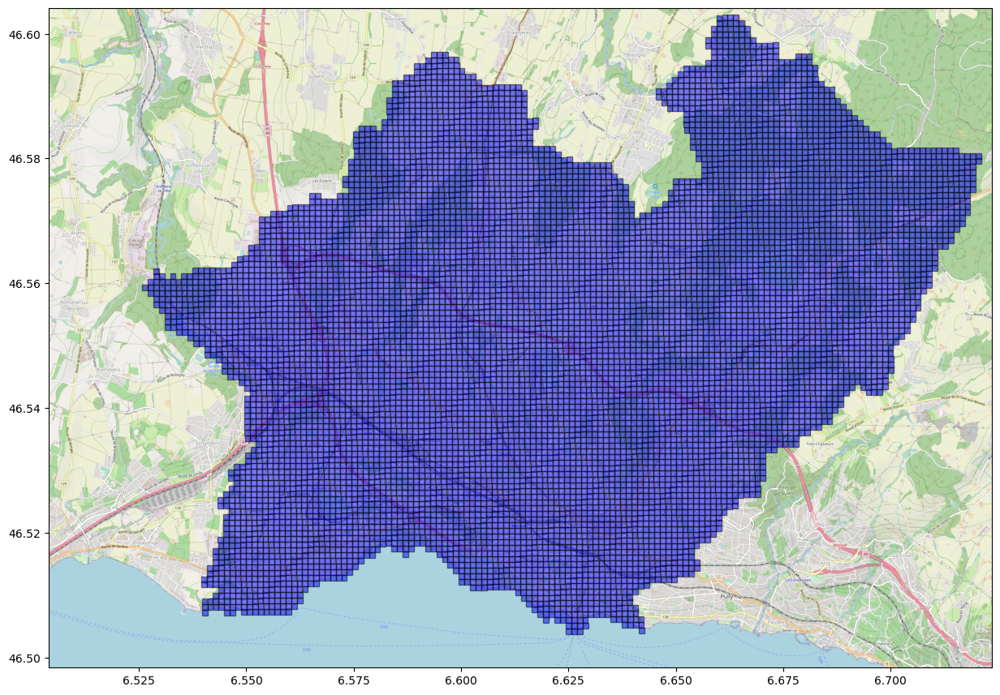

In [7]:
# plot all tiles
zoom = 14
stitched_14, bbox_14, map_size_14 = osm_tiles.get_stitched_map_and_bbox(tile_coords_df_all, zoom, verbose=False)
visualize.plot_all_tiles_on_map(tile_coords_df_all, stitched_14, bbox_14, map_size=map_size_14)

### Get the scores for the demo day

In [8]:
# hourly for demo day
hourly_range = pd.date_range(start='2020-01-27', end='2020-01-28', freq='1H', closed='left')
scores_l = []
for district_nbr, tile_coords_df in zip(district_nbrs, tile_coords):
    print(district_nbr)
    scores_clean = fetch_scores(api_handle, tile_coords_df, district_nbr, hourly_range)
    scores_l.append(scores_clean)
scores_clean_all = pd.concat(scores_l).drop_duplicates()
scores_clean_all.head()

2225
Loading tile scores for district nbr 2225 from cached file
2229
Loading tile scores for district nbr 2229 from cached file


,ll_x,ll_y,ur_x,ur_y,2020-01-27 00:00:00,2020-01-27 01:00:00,2020-01-27 02:00:00,2020-01-27 03:00:00,2020-01-27 04:00:00,2020-01-27 05:00:00,...,2020-01-27 14:00:00,2020-01-27 15:00:00,2020-01-27 16:00:00,2020-01-27 17:00:00,2020-01-27 18:00:00,2020-01-27 19:00:00,2020-01-27 20:00:00,2020-01-27 21:00:00,2020-01-27 22:00:00,2020-01-27 23:00:00
tileId,,,,,,,,,,,,,,,,,,,,,
23610282,6.585037,46.521485,6.586326,46.522394,10.0,10.0,10.0,10.0,10.0,10.0,...,43.0,42.0,38.0,34.0,27.0,21.0,10.0,10.0,10.0,10.0
23617155,6.585022,46.522385,6.586311,46.523294,10.0,22.0,23.0,23.0,23.0,23.0,...,87.0,85.0,74.0,61.0,46.0,35.0,30.0,27.0,23.0,10.0
23624029,6.585008,46.523284,6.586297,46.524193,23.0,31.0,32.0,32.0,32.0,32.0,...,104.0,104.0,88.0,67.0,53.0,42.0,36.0,32.0,30.0,21.0
23617154,6.586340,46.521495,6.587629,46.522404,10.0,23.0,24.0,24.0,24.0,24.0,...,36.0,36.0,34.0,34.0,30.0,29.0,28.0,27.0,25.0,10.0
23624028,6.586326,46.522394,6.587614,46.523304,34.0,45.0,46.0,46.0,46.0,46.0,...,61.0,61.0,59.0,58.0,55.0,54.0,54.0,51.0,48.0,34.0


### Visualize the density evolution for the demo day

In [9]:
importlib.reload(visualize)
from IPython.display import HTML
fig, ax = plt.subplots(figsize=(10, 10))
stitched_14_clean, bbox_14_clean, map_size_14_clean = osm_tiles.get_stitched_map_and_bbox(scores_clean_all, zoom, verbose=False)
anim = visualize.animated_plot(fig, ax, scores_clean_all, stitched_14_clean, bbox_14_clean, map_size_14_clean, hourly_range)
plt.close()

In [10]:
HTML(anim.to_html5_video())

### Visualize the density at 3PM on the demo day

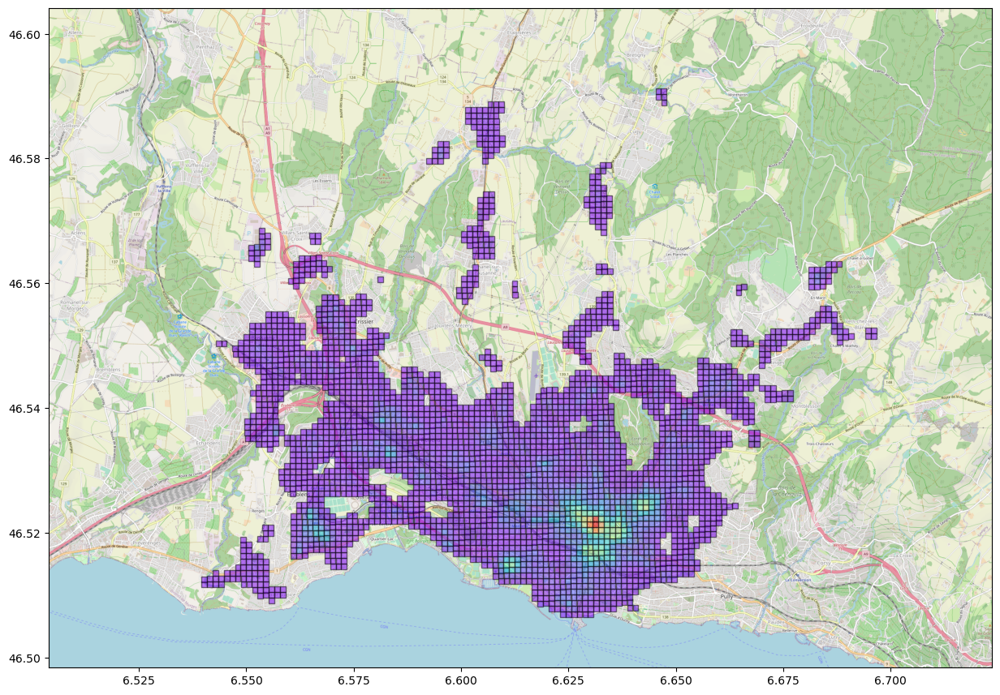

In [11]:
visualize.plot_all_tiles_on_map(scores_clean_all, stitched_14, bbox_14, map_size_14, hourly_range[15])

## TimeSeries Clustering

In [12]:
# removing the coordinates as they will not be needed or the clustering
scores = scores_clean_all.drop(columns=['ll_x', 'll_y', 'ur_x', 'ur_y'])
scores_array = scores.to_numpy()
norm_scores = scores_array / scores_array.max(axis=1).reshape(-1, 1)

### Visualize a few TimeSeries

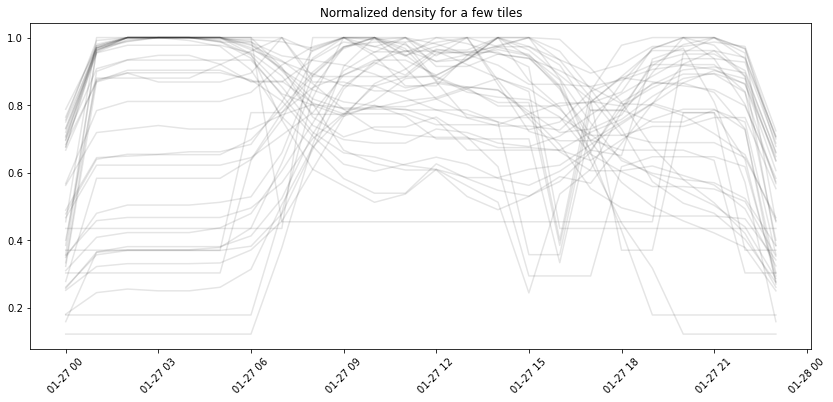

In [13]:
import random
x_values = scores.columns.to_list()
dims = norm_scores.shape
sampled_tiles = random.sample(range(dims[0]), 40)

plt.figure(figsize=(14,6))
for t_series in norm_scores[sampled_tiles,:]:
    plt.plot(x_values, t_series, alpha=0.1, c='k')
plt.title('Normalized density for a few tiles')
plt.xticks(rotation=45)
plt.show()

We can already see that there are trends in our TimeSeries. Some have a very low normalized score during the night and are maximum during the work hours, whereas others express the opposite trend namely high during the night and lower during work hours.

In [14]:
# prepare data for clustering
# format needs to be (num_time_series, max_series_length, 1)
# so for us : (num_tiles, 24, 1)

tiles_time_series = norm_scores[:,:,np.newaxis]
tiles_time_series.shape

(3194, 24, 1)

### Clustering TimeSeries with Dynamic Time Warping method

We will be clustering the time series using the DTW method (Dynamic Time Warping). This technique is best suited for TimeSeries than classical euclidean method as it lets us compare TimeSeries that have different length, speed and offsets.

Using KMeans we are able to define clusters to identify geographical zones that share the same evolution of density over time.

The number of clusters was set to 5 as it seemed to give good results compared to other values.

In [15]:
from tslearn.clustering import TimeSeriesKMeans

model = TimeSeriesKMeans(n_clusters=5, metric="dtw", max_iter=1000, random_state=42)
model.fit(tiles_time_series)
scores_clean_all['class'] = model.labels_

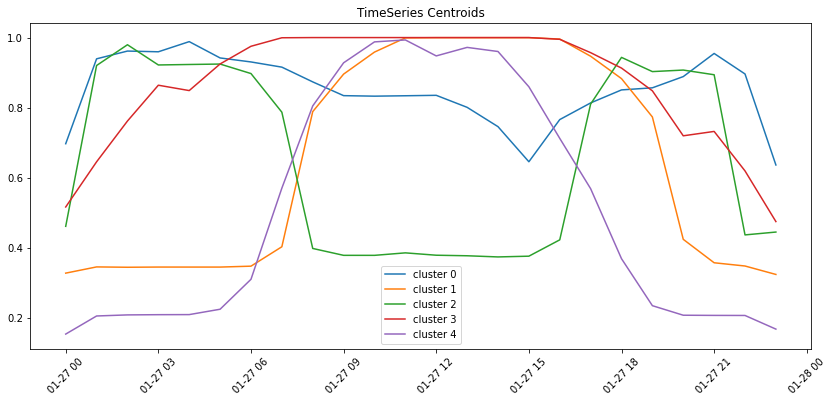

In [16]:
plt.figure(figsize=(14,6))
for i, centroid in enumerate(model.cluster_centers_):
    plt.plot(x_values, centroid, label=f'cluster {i}')
plt.title('TimeSeries Centroids')
plt.xticks(rotation=45)
plt.legend()
plt.show()

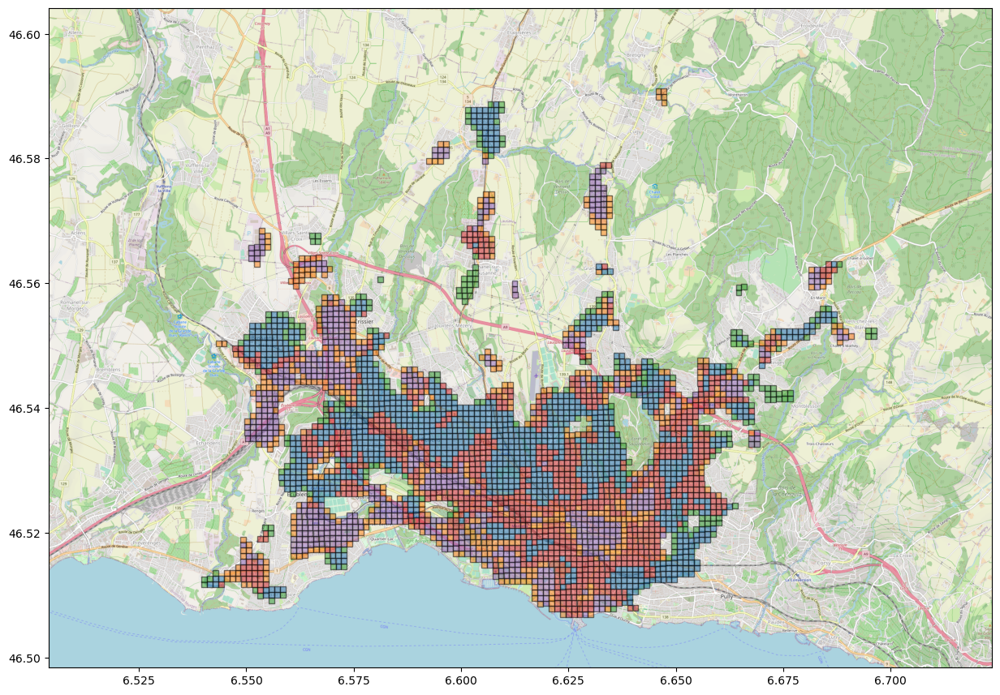

In [17]:
importlib.reload(osm_tiles)
importlib.reload(visualize)
visualize.plot_all_tiles_on_map(scores_clean_all, stitched_14, bbox_14, map_size_14, 'class')

With these 2 plots we see that the violet areas are work places which is logical as we can identify EPFL in the lower left corner and the city center of Lausanne. Other daytime active zones are the Industrial zone of Bussigny-Crissier and the Lake side.

On the other hand we have the green zones that exhibit the opposite behaviour: mostly residential areas that are almost empty during the day when people go to work. Such zones can be found in the less urban areas of the district.

Blue areas see less fluctuation during over day and night as they seem to be mostly mixed zones (residential and activity zones).

Observation about the data: it seems that the density drops during the night for almost all zones, this can be due to people shutting off their phones.

In [18]:
from tslearn.clustering import TimeSeriesKMeans
def analysis(district_nbrs, api_handle):
    tile_coords = []
    for district_nbr in district_nbrs:
        tile_coords.append(fetch_tile_ids_for_district(api_handle, district_nbr=district_nbr))
    tile_coords_df_all = pd.concat(tile_coords).drop_duplicates()
    
    zoom = 14
    stitched_14, bbox_14, map_size_14 = osm_tiles.get_stitched_map_and_bbox(tile_coords_df_all, zoom, verbose=False)
    visualize.plot_all_tiles_on_map(tile_coords_df_all, stitched_14, bbox_14, map_size=map_size_14)
    
    hourly_range = pd.date_range(start='2020-01-27', end='2020-01-28', freq='1H', closed='left')
    scores_l = []
    for district_nbr, tile_coords_df in zip(district_nbrs, tile_coords):
        scores_clean = fetch_scores(api_handle, tile_coords_df, district_nbr, hourly_range)
        scores_l.append(scores_clean)
    scores_clean_all = pd.concat(scores_l).drop_duplicates()
    
    scores = scores_clean_all.drop(columns=['ll_x', 'll_y', 'ur_x', 'ur_y'])
    scores_array = scores.to_numpy()
    norm_scores = scores_array / scores_array.max(axis=1).reshape(-1, 1)
    
    tiles_time_series = norm_scores[:,:,np.newaxis]
    tiles_time_series.shape
    
    model = TimeSeriesKMeans(n_clusters=5, metric="dtw", max_iter=1000, random_state=42)
    model.fit(tiles_time_series)
    scores_clean_all['class'] = model.labels_
    
    x_values = scores.columns.to_list()
    
    plt.figure(figsize=(14,6))
    for i, centroid in enumerate(model.cluster_centers_):
        plt.plot(x_values, centroid, label=f'cluster {i}')
    plt.title('TimeSeries Centroids')
    plt.xticks(rotation=45)
    plt.legend()
    plt.show()
    
    visualize.plot_all_tiles_on_map(scores_clean_all, stitched_14, bbox_14, map_size_14, 'class')

Loading tile coords for district nbr 112 from cached file


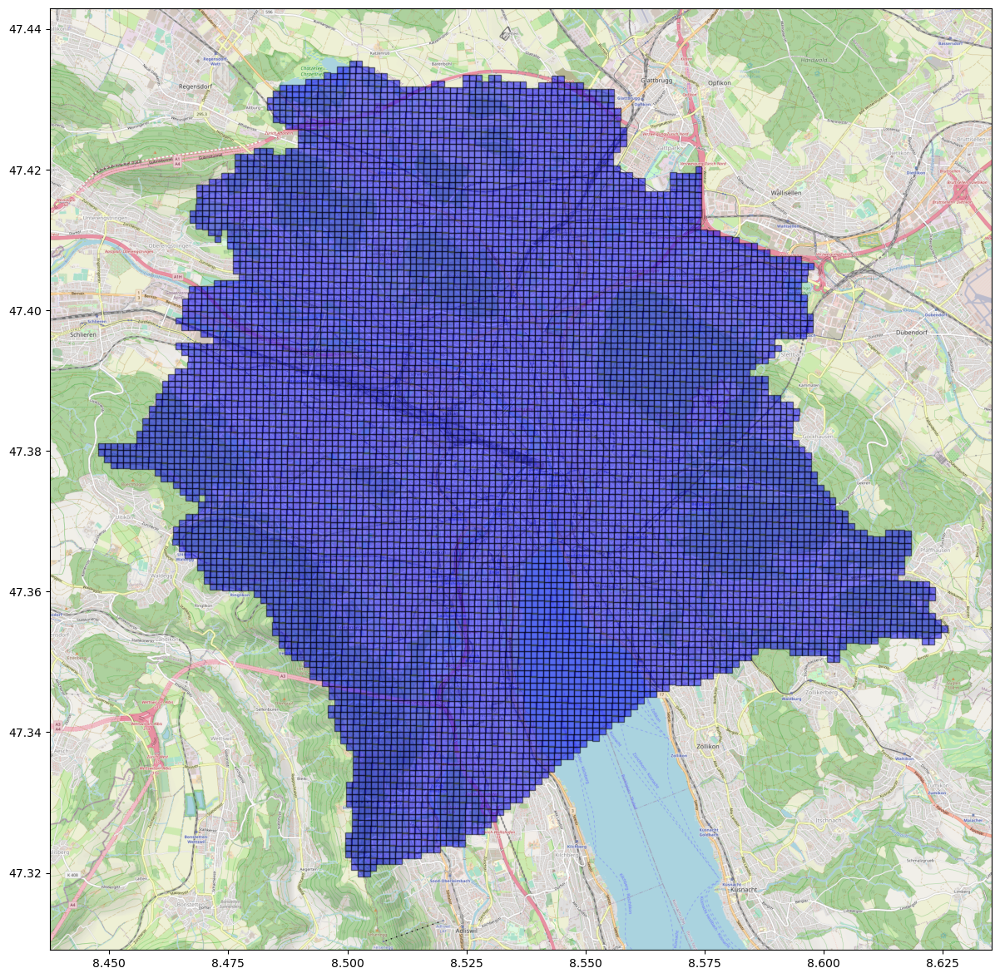

Loading tile scores for district nbr 112 from cached file


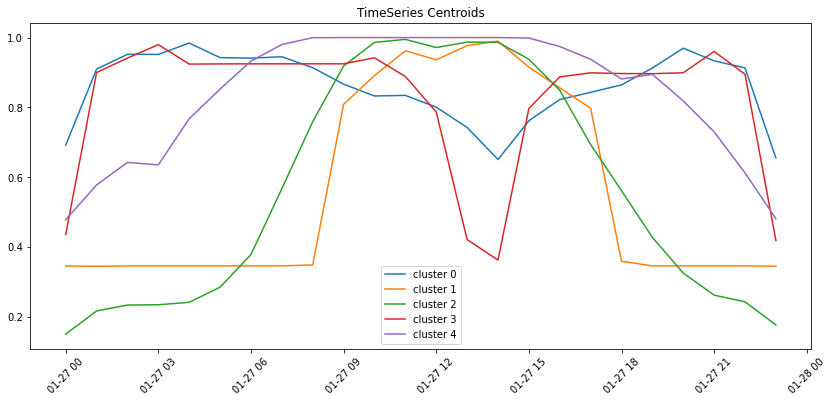

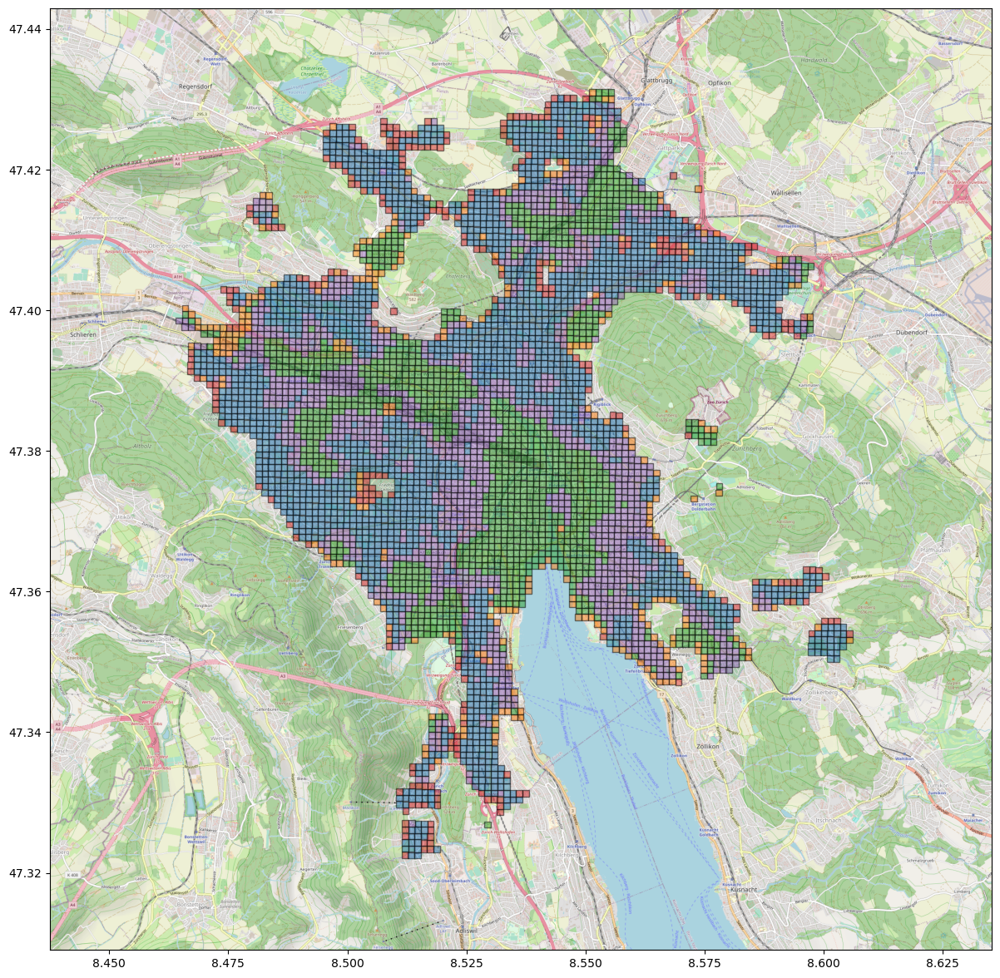

In [19]:
district_nbrs = [112]
analysis(district_nbrs, api_handle)

For Zürich, the daily active zone is here depicted in green. Red and blue zones are residential areas. 